# Coursera IBM Data Science Capstone Project

#### Opening a new Supermarket in Los Angeles ,California

•	Build a dataframe of neighborhoods in Los Angeles, California by web scraping the data from Wikipedia page

•	Get the geographical coordinates of the neighborhoods

•	Obtain the venue data for the neighborhoods from Foursquare API

•	Explore and cluster the neighborhoods

•	Select the best cluster to open a new Supermarket


### 1. Importing Libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import geocoder # to get coordinates

import requests # library to handle requests
from bs4 import BeautifulSoup # library to parse HTML and XML documents

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library
#!conda install -c conda-forge wordcloud==1.4.1 --yes
from wordcloud import WordCloud, get_single_color_func

print("Done.")

Done.


### 2. Get data from Excel file containing Neighborhood Details

In [2]:
# Read files
los_angeles_data=pd.read_excel("E:\Saurav\LAPPY\study\Coursera\IBM_Data_Science\project\IBM_DATA_SCIENCE\Final_project_week_4_5\los_angeles_neighborhood_data_new.xlsx")
los_angeles_data

,Neighborhood
0,Angelino Heights
1,Angeles Mesa
2,Angelus Vista
3,Arleta
4,Arlington Heights
5,Arts District
6,Atwater Village
7,Baldwin Hills
8,Baldwin Hills/Crenshaw
9,Baldwin Village


### 3. Get neighborhood coordinates

In [3]:

# define a function to get coordinates
def get_latlng(neighborhood):
    # initialize your variable to None
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Los Angeles, California'.format(neighborhood))
        lat_lng_coords = g.latlng
    return lat_lng_coords

In [4]:
# call the function to get the coordinates, store in a new list using list comprehension
coords = [ get_latlng(neighborhood) for neighborhood in los_angeles_data["Neighborhood"].tolist() ]

In [5]:
coords

[[34.07029000000006, -118.25479999999999],
 [32.76407555530466, -116.98617011713063],
 [34.08758075672148, -118.26715413548087],
 [34.24905000000007, -118.43348999999995],
 [34.03989000000007, -118.32541999999995],
 [34.04807992671258, -118.2578500732874],
 [34.11970000000008, -118.25886999999994],
 [34.021570000000054, -118.36764999999997],
 [34.011569938831634, -118.33646000779022],
 [34.07044551895969, -118.2007101693803],
 [34.07044551895969, -118.2007101693803],
 [34.10915204015591, -118.32045343389233],
 [34.08361000000008, -118.43482999999998],
 [34.09384336187649, -118.42911274284965],
 [34.096529660177524, -118.4032980663708],
 [34.11793000000006, -118.44608999999997],
 [34.09544972015064, -118.42608605996772],
 [34.06151995614296, -118.39908997720605],
 [34.063720000000046, -118.26459999999997],
 [34.05138000000005, -118.40132999999997],
 [34.04004000000003, -118.21049999999997],
 [34.06626000000006, -118.47032999999999],
 [33.98805000000001, -118.277208],
 [33.98805000000001

In [6]:
# create temporary dataframe to populate the coordinates into Latitude and Longitude
df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])

In [7]:
# merge the coordinates into the original dataframe
los_angeles_data['Latitude'] = df_coords['Latitude']
los_angeles_data['Longitude'] = df_coords['Longitude']

In [8]:
# check the neighborhoods and the coordinates
print(los_angeles_data.shape)
los_angeles_data

(194, 3)


,Neighborhood,Latitude,Longitude
0,Angelino Heights,34.070290,-118.254800
1,Angeles Mesa,32.764076,-116.986170
2,Angelus Vista,34.087581,-118.267154
3,Arleta,34.249050,-118.433490
4,Arlington Heights,34.039890,-118.325420
5,Arts District,34.048080,-118.257850
6,Atwater Village,34.119700,-118.258870
7,Baldwin Hills,34.021570,-118.367650
8,Baldwin Hills/Crenshaw,34.011570,-118.336460
9,Baldwin Village,34.070446,-118.200710


### 4. Create a map of Los Angeles with neighborhoods superimposed on top

In [9]:
# get the coordinates of Los Angeles
address = 'Los Angeles, California'

geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Los Angeles, California {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Los Angeles, California 34.0536909, -118.2427666.


In [10]:
# create map of Los Angeles using latitude and longitude values
map_LA = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, neighborhood in zip(los_angeles_data['Latitude'], los_angeles_data['Longitude'], los_angeles_data['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_LA)  
    
map_LA

In [11]:
# save the map as HTML file
map_LA.save('map_LA.html')

### 5. Use the Foursquare API to explore the neighborhoods

In [12]:
# define Foursquare Credentials and Version
CLIENT_ID = '3X23YXNCVQTROXF2LA3OOLQQ1ZUAFJVJZJY3XVZEUAHRUMAI' # your Foursquare ID
CLIENT_SECRET = 'T1U0CPYBO4DPH4I1AHUFMMWZ33HF43QKMVFRRBXKAD0NBLR1' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3X23YXNCVQTROXF2LA3OOLQQ1ZUAFJVJZJY3XVZEUAHRUMAI
CLIENT_SECRET:T1U0CPYBO4DPH4I1AHUFMMWZ33HF43QKMVFRRBXKAD0NBLR1


##### Now, let's get the top 100 venues that are within a radius of 2000 meters.

In [13]:
radius = 2000
LIMIT = 100

venues = []

for lat, long, neighborhood in zip(los_angeles_data['Latitude'], los_angeles_data['Longitude'], los_angeles_data['Neighborhood']):
    
    # create the API request URL
    url = "https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}".format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,
        long,
        radius, 
        LIMIT)
    
    # make the GET request
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    # return only relevant information for each nearby venue
    for venue in results:
        venues.append((
            neighborhood,
            lat, 
            long, 
            venue['venue']['name'], 
            venue['venue']['location']['lat'], 
            venue['venue']['location']['lng'],  
            venue['venue']['categories'][0]['name']))

In [14]:
# convert the venues list into a new DataFrame
venues_df = pd.DataFrame(venues)

# define the column names
venues_df.columns = ['Neighborhood', 'Latitude', 'Longitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']

print(venues_df.shape)
venues_df.head()

(16533, 7)


,Neighborhood,Latitude,Longitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Angelino Heights,34.07029,-118.2548,Halliwell Manor,34.069329,-118.254165,Performing Arts Venue
1,Angelino Heights,34.07029,-118.2548,Guisados,34.070262,-118.250437,Taco Place
2,Angelino Heights,34.07029,-118.2548,Eightfold Coffee,34.071245,-118.250698,Coffee Shop
3,Angelino Heights,34.07029,-118.2548,Konbi,34.075383,-118.253893,Japanese Restaurant
4,Angelino Heights,34.07029,-118.2548,Button Mash,34.073975,-118.251507,Arcade


In [15]:
#to check for venues per neighborhood
venues_df.groupby(["Neighborhood"]).count()

,Latitude,Longitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Angeles Mesa,42,42,42,42,42,42
Angelino Heights,100,100,100,100,100,100
Angelus Vista,100,100,100,100,100,100
Arleta,56,56,56,56,56,56
Arlington Heights,100,100,100,100,100,100
Arts District,100,100,100,100,100,100
Atwater Village,100,100,100,100,100,100
Baldwin Hills,94,94,94,94,94,94
Baldwin Hills/Crenshaw,73,73,73,73,73,73


In [16]:
print('There are {} uniques categories.'.format(len(venues_df['VenueCategory'].unique())))

There are 429 uniques categories.


In [17]:
# print out the list of categories
venues_df['VenueCategory'].unique()

array(['Performing Arts Venue', 'Taco Place', 'Coffee Shop',
       'Japanese Restaurant', 'Arcade', 'American Restaurant', 'Sake Bar',
       'Massage Studio', 'Beer Store', 'Art Gallery', 'Cocktail Bar',
       'Bar', 'Vegetarian / Vegan Restaurant', 'Park', 'Breakfast Spot',
       'Pizza Place', 'Historic Site', 'Music Venue',
       'Latin American Restaurant', 'Deli / Bodega', 'Pet Store',
       'Bookstore', 'Wine Bar', 'Convenience Store', 'Museum', 'Pool',
       'Theater', 'Mexican Restaurant', 'Health Food Store', 'Circus',
       'Bakery', 'Café', 'Food Truck', 'Gym / Fitness Center',
       'Gastropub', 'Baseball Stadium', 'Grocery Store', 'Art Museum',
       'Scenic Lookout', 'Plaza', 'Thai Restaurant', 'Clothing Store',
       'Concert Hall', 'Sports Bar', 'Yoga Studio',
       'Vietnamese Restaurant', 'Fried Chicken Joint',
       'Jewish Restaurant', 'School', 'Burger Joint', 'Baseball Field',
       'Filipino Restaurant', 'Fast Food Restaurant', 'Motel', 'Trail',
   

In [18]:
# check if the results contain "Shopping Mall"
"Supermarket" in venues_df['VenueCategory'].unique()

True

### 6. Analyze Each Neighborhood

In [19]:
# one hot encoding
la_onehot = pd.get_dummies(venues_df[['VenueCategory']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
la_onehot['Neighborhood'] = venues_df['Neighborhood']
la_onehot['Latitude'] = venues_df['Latitude'] 
la_onehot['Longitude'] = venues_df['Longitude'] 

# move neighborhood column to the first column
fixed_columns = [la_onehot.columns[-1]] + list(la_onehot.columns[:-1])
la_onehot = la_onehot[fixed_columns]

print(la_onehot.shape)
la_onehot.head()

(16533, 431)


,Longitude,ATM,Accessories Store,Adult Boutique,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cave,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Rec Center,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donburi Restaurant,Doner Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Ind

In [20]:
#group rows by neighborhood and by take the mean of the frequency of occurrence of each category
la_grouped = la_onehot.groupby(["Neighborhood",'Latitude','Longitude']).mean().reset_index()

print(la_grouped.shape)
la_grouped

(194, 431)


,Neighborhood,Latitude,Longitude,ATM,Accessories Store,Adult Boutique,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cave,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Rec Center,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donburi Restaurant,Doner Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,

In [21]:
len(la_grouped[la_grouped["Supermarket"] > 0])

64

##### Create a new DataFrame for Supermarket data

In [22]:
la_market = la_grouped[["Neighborhood","Supermarket"]]

In [23]:
la_market.head()

,Neighborhood,Supermarket
0,Angeles Mesa,0.000000
1,Angelino Heights,0.000000
2,Angelus Vista,0.000000
3,Arleta,0.017857
4,Arlington Heights,0.000000


### 7. Cluster Neighborhoods

In [24]:
# Finding best k
plt.style.use("seaborn")
Ks = 11
mse = np.zeros((Ks-1))
la_grouped_clustering = la_grouped.drop(['Neighborhood','Latitude','Longitude'], 1)
la_grouped_clustering


,ATM,Accessories Store,Adult Boutique,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cave,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Rec Center,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donburi Restaurant,Doner Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Indian Restaurant,Notary,O

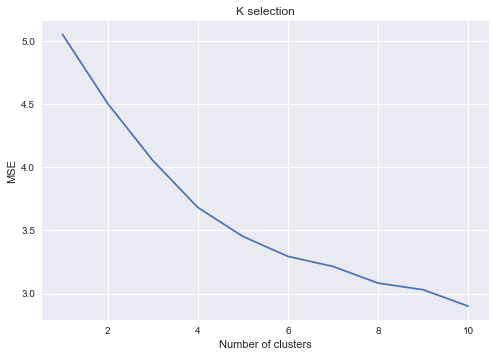

In [25]:
for n in range(1,Ks):
    
    # set number of clusters
    kclusters = n
    # run k-means clustering
    kmeans = KMeans(n_clusters=kclusters, random_state=0, init = 'random', n_init = 15).fit(la_grouped_clustering)
    mse[n-1] = kmeans.inertia_

plt.plot(range(1,Ks),mse)
plt.xlabel("Number of clusters")
plt.ylabel("MSE")
plt.title("K selection")
plt.show()

In [26]:
# set number of clusters
kclusters = 4

la_clustering = la_market.drop(["Neighborhood"], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(la_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 1, 0, 1, 1, 2, 0, 2, 1])

In [27]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
la_merged = la_market.copy()

# add clustering labels
la_merged["Cluster Labels"] = kmeans.labels_

In [28]:
la_merged.rename(columns={"Neighborhoods": "Neighborhood"}, inplace=True)
la_merged.head()


,Neighborhood,Supermarket,Cluster Labels
0,Angeles Mesa,0.000000,1
1,Angelino Heights,0.000000,1
2,Angelus Vista,0.000000,1
3,Arleta,0.017857,0
4,Arlington Heights,0.000000,1


In [29]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
la_merged = la_merged.join(los_angeles_data.set_index("Neighborhood"), on="Neighborhood")

print(la_merged.shape)
la_merged.head()

(194, 5)


,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
0,Angeles Mesa,0.000000,1,32.764076,-116.986170
1,Angelino Heights,0.000000,1,34.070290,-118.254800
2,Angelus Vista,0.000000,1,34.087581,-118.267154
3,Arleta,0.017857,0,34.249050,-118.433490
4,Arlington Heights,0.000000,1,34.039890,-118.325420


In [30]:
# sort the results by Cluster Labels
print(la_merged.shape)
la_merged.sort_values(["Cluster Labels"], inplace=True)
la_merged

(194, 5)


,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
130,Porter Ranch,0.016393,0,34.280270,-118.561300
150,Sunland,0.018868,0,34.259690,-118.314240
133,Reynier Village,0.020000,0,33.994051,-118.375942
148,Studio City,0.020000,0,34.144530,-118.395610
109,Monterey Hills,0.016129,0,34.091330,-118.188120
163,Van Nuys,0.020000,0,34.184390,-118.446520
36,Chesterfield Square,0.016393,0,33.992510,-118.312850
38,Chinatown,0.020000,0,34.062290,-118.238370
58,Filipinotown,0.020000,0,34.053490,-118.245320
144,"South Central, Historic",0.020000,0,34.042547,-118.239795


##### visualize the clusters

In [31]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(la_merged['Latitude'], la_merged['Longitude'], la_merged['Neighborhood'], la_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [32]:
# save the map as HTML file
map_clusters.save('map_clusters.html')

### 8. Examine Clusters

##### Cluster  0

In [33]:
cl0 = la_merged.loc[la_merged['Cluster Labels'] == 0]
cl0

,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
130,Porter Ranch,0.016393,0,34.280270,-118.561300
150,Sunland,0.018868,0,34.259690,-118.314240
133,Reynier Village,0.020000,0,33.994051,-118.375942
148,Studio City,0.020000,0,34.144530,-118.395610
109,Monterey Hills,0.016129,0,34.091330,-118.188120
163,Van Nuys,0.020000,0,34.184390,-118.446520
36,Chesterfield Square,0.016393,0,33.992510,-118.312850
38,Chinatown,0.020000,0,34.062290,-118.238370
58,Filipinotown,0.020000,0,34.053490,-118.245320
144,"South Central, Historic",0.020000,0,34.042547,-118.239795


##### Cluster 1

In [34]:
cl1 = la_merged.loc[la_merged['Cluster Labels'] == 1]
cl1

,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
129,Playa del Rey,0.0,1,33.959240,-118.448010
118,Old Bank District,0.0,1,34.048080,-118.257850
124,Picfair Village,0.0,1,34.045000,-118.365280
121,Palms,0.0,1,34.019860,-118.420960
123,Park La Brea,0.0,1,34.062560,-118.357630
125,Pico Robertson,0.0,1,34.055750,-118.380000
117,Northridge,0.0,1,34.235030,-118.533860
127,Platinum Triangle,0.0,1,33.977563,-118.136649
126,Pico-Union,0.0,1,34.040040,-118.285550
0,Angeles Mesa,0.0,1,32.764076,-116.986170


##### Cluster 2

In [35]:
cl2 = la_merged.loc[la_merged['Cluster Labels'] == 2]
cl2

,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
186,Wholesale District,0.010000,2,34.036706,-118.236463
185,Whitley Heights,0.010000,2,34.109601,-118.331732
184,Westwood Village,0.010000,2,34.059750,-118.443270
190,Windsor Square,0.010000,2,34.068960,-118.318710
183,Westwood,0.010000,2,34.061680,-118.445450
11,Beachwood Canyon,0.010000,2,34.109152,-118.320453
176,West Hills,0.010000,2,34.200360,-118.629330
8,Baldwin Hills/Crenshaw,0.013699,2,34.011570,-118.336460
6,Atwater Village,0.010000,2,34.119700,-118.258870
188,Wilshire Center,0.010000,2,34.062430,-118.292930


##### Cluster 3

In [36]:
cl3 = la_merged.loc[la_merged['Cluster Labels'] == 3]
cl3

,Neighborhood,Supermarket,Cluster Labels,Latitude,Longitude
120,Pacific Palisades,0.029412,3,34.047100,-118.526880
171,Village Green,0.027027,3,34.019938,-118.365432
170,Victoria Park,0.028571,3,33.766880,-118.409630
162,Valley Village,0.026667,3,34.164880,-118.398030


### Wordcloud

In [37]:
word_string = ""
for neighborhood in la_merged["Neighborhood"]:
    elements = ""
    for element in neighborhood.split(","):
        elements += element.strip().replace(" ", "") + " "
    word_string += elements+" "
word_string = word_string.replace(".","")

tmp = cl0["Neighborhood"].tolist()
cl0_list = []
for element in tmp:
    cl0_list.extend(element.split(", "))
cl0_list = [element.replace(" ","") for element in cl0_list]

tmp = cl1["Neighborhood"].tolist()
cl1_list = []
for element in tmp:
    cl1_list.extend(element.split(", "))
cl1_list = [element.replace(" ","") for element in cl1_list]

tmp = cl2["Neighborhood"].tolist()
cl2_list = []
for element in tmp:
    cl2_list.extend(element.split(", "))
cl2_list = [element.replace(" ","") for element in cl2_list]
    
tmp = cl3["Neighborhood"].tolist()
cl3_list = []
for element in tmp:
    cl3_list.extend(element.split(", "))
cl3_list = [element.replace(" ","") for element in cl3_list]
cl3_list = [element.replace(".","") for element in cl3_list]



cl1_list

['PlayadelRey',
 'OldBankDistrict',
 'PicfairVillage',
 'Palms',
 'ParkLaBrea',
 'PicoRobertson',
 'Northridge',
 'PlatinumTriangle',
 'Pico-Union',
 'AngelesMesa',
 'NorthHollywood',
 'Larchmont',
 'LaurelCanyon',
 'LeimertPark',
 'LincolnHeights',
 'LittleEthiopia',
 'LosFeliz',
 'MandevilleCanyon',
 'MarVista',
 'NorthUniversityPark',
 'MarinaPeninsula',
 'Mid-Wilshire',
 'MiracleMile',
 'MissionHills',
 'MontecitoHeights',
 'MountOlympus',
 'NicholsCanyon',
 'NoHoArtsDistrict',
 'NorthHills',
 'Mid-City',
 'MountWashington',
 'SilverLake',
 'SanPedro',
 'VermontSquare',
 'VermontVista',
 'Vermont-Slauson',
 'VictorHeights',
 'WarnerCenter',
 'Watts',
 'VermontKnolls',
 'WestLosAngeles',
 'WesternHeights',
 'Westlake',
 'WestsideVillage',
 'Wilmington',
 'WilshirePark',
 'Winnetka',
 'Westdale',
 'Venice',
 'ValleyGlen',
 'UniversityPark',
 'ShadowHills',
 'ShermanVillage',
 'LakeViewTerrace',
 'SolanoCanyon',
 'SouthPark',
 'SouthRobertson',
 'SpauldingSquare',
 'SunValley',
 'Sylm

Word cloud created!


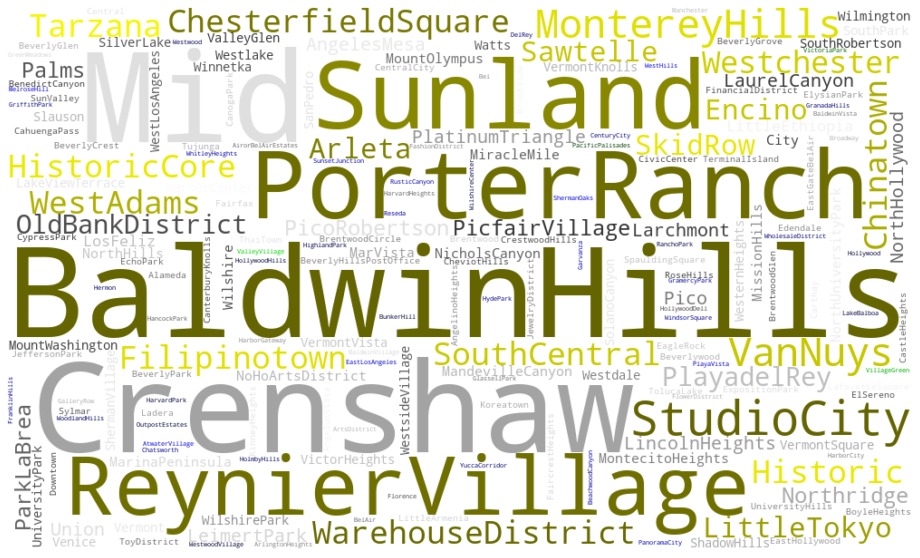

In [38]:
class GroupedColorFunc(object):
    """Create a color function object which assigns DIFFERENT SHADES of
       specified colors to certain words based on the color to words mapping.

       Uses wordcloud.get_single_color_func

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.color_func_to_words = [
            (get_single_color_func(color), set(words))
            for (color, words) in color_to_words.items()]

        self.default_color_func = get_single_color_func(default_color)

    def get_color_func(self, word):
        """Returns a single_color_func associated with the word"""
        try:
            color_func = next(
                color_func for (color_func, words) in self.color_func_to_words
                if word in words)
        except StopIteration:
            color_func = self.default_color_func

        return color_func

    def __call__(self, word, **kwargs):
        return self.get_color_func(word)(word, **kwargs)

wordcloud = WordCloud(width=1000, height=600, background_color='white', max_words = 500).generate(word_string)

color_to_words = {
    # words below will be colored with a green single color function
    'yellow': cl0_list,
    # will be colored with a red single color function
    'black': cl1_list,
    'blue': cl2_list,
    '#00ff00': cl3_list
}

default_color = 'grey'

print('Word cloud created!')

fig = plt.figure()
fig.set_figwidth(500)
fig.set_figheight(10)

grouped_color_func = GroupedColorFunc(color_to_words, default_color)

# Apply our color function
wordcloud.recolor(color_func=grouped_color_func)

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

## Conclusion :


###### Based on the clustering of neighborhoods, we can see that Cluster 1 has no Supermarkets followed by some supermarkets in cluster 2 ,cluster 0 and cluster 3 respectively. It would be a good option to open a Supermarket in any of the neighborhoods that fall under Cluster 0. In order to decide a neighborhood within cluster 0 we can improve this analysis using 2 more criterias. First criteria would be to analyze those neighborhoods based on their population as higher population will lead to more customers in the supermarket which is highly essential for new businesses. Second criteria to be considered is the cost of land as this would highly affect the Return on Investment factor of the Supermarket. For this , we can analyze the cost of land for each neighborhood falling under cluster 0 and look for the cheaper options to open a Supermarket. Considering these conditions, the best case scenario to open a supermarket would be in a neighborhood with high population and low cost of land as this will Increase Return on Inverstment and ensure stable income due to high population.